# Evaluating Tikhonet Trained

In this Notebook we are going to evaluate the performance of a [Tikhonet](https://arxiv.org/pdf/1911.00443.pdf) trained.

## Required Libraries and Functions

In [1]:
%matplotlib inline
import sys

# Add library path to PYTHONPATH
lib_path = '/gpfswork/rech/xdy/uze68md/GitHub/'
path_alphatransform = lib_path+'alpha-transform'
path_score = lib_path+'score'
sys.path.insert(0, path_alphatransform)
sys.path.insert(0, path_score)
data_path = '/gpfswork/rech/xdy/uze68md/data/'
model_dir = '/gpfswork/rech/xdy/uze68md/trained_models/model_cfht/'

# Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import fft
import cadmos_lib as cl
import tensorflow as tf
import galsim
from galsim import Image
import galsim.hsm
import pickle

## Load The Comparison Batch

In [2]:
f = open(data_path+"cfht_batch.pkl", "rb")
batch = pickle.load(f)
f.close()

#correct tikhonov inputs normalisation factor
norm_factor = 4e3
batch['inputs_tikho'] *= norm_factor

## Load and Apply Trained Model on Batch

In [3]:
model_name = 'tikhonet_None-constraint_scales-4_steps-625_epochs-10_growth_rate-12_batch_size-128_activationfunction-relu'
# g: gamma (trade-off parameter of the shape constraint)
model_g05_name = 'tikhonet_multi-constraint_scales-4_gamma-0.5_shearlet-3_steps-625_epochs-10_growth_rate-12_batch_size-128_activationfunction-relu'
model = tf.keras.models.load_model(model_dir+model_name, compile=False)
model_g05 = tf.keras.models.load_model(model_dir+model_g05_name, compile=False)
res = model(np.expand_dims(batch['inputs_tikho'], axis=-1))
res_np = tf.keras.backend.eval(res)[...,0]
res_g05 = model_g05(np.expand_dims(batch['inputs_tikho'], axis=-1))
res_g05_np = tf.keras.backend.eval(res_g05)[...,0]
score_g0 = np.load(data_path+'score_g0.npy')
score_g1 = np.load(data_path+'score_g1.npy')

# generate the psfs in the spatial domain
psf_hst = np.fft.ifftshift(np.fft.irfft2(batch['psf_hst'][0]))
psf_tile_cfht = np.array([np.fft.ifftshift(np.fft.irfft2(p)) for p in batch['psf_cfht']])
# make psf tiles
psf_tile_hst = np.repeat(psf_hst[np.newaxis, :, :], batch['psf_hst'].shape[0], axis=0)
# psf_tile_cfht = np.repeat(psf_cfht[np.newaxis, :, :], k_batch*n_batch, axis=0)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


### Flag Moments Measurement Failure

In [4]:
im_size = 64
scale = 0.1

def EllipticalGaussian(e1, e2, sig, xc=im_size//2, yc=im_size//2, stamp_size=(im_size,im_size)):
    # compute centered grid
    ranges = np.array([np.arange(i) for i in stamp_size])
    x = np.outer(ranges[0] - xc, np.ones(stamp_size[1]))
    y = np.outer(np.ones(stamp_size[0]),ranges[1] - yc)
    # shift it to match centroid
    xx = (1-e1/2)*x - e2/2*y
    yy = (1+e1/2)*y - e2/2*x
    # compute elliptical gaussian
    return np.exp(-(xx ** 2 + yy ** 2) / (2 * sig ** 2))

def get_moments(images, bool_window=False):
    g_list,error_flag_list=[],[]
    if bool_window:
        window_list = []
        window_flag_list = []
    for image in images:
        error_flag = True
        #create a galsim version of the data
        image_galsim = galsim.Image(image,scale=scale)
        #estimate the moments of the observation image
        shape = galsim.hsm.FindAdaptiveMom(image_galsim
                                         ,guess_centroid=galsim.PositionD(im_size//2,im_size//2)
                                         ,strict=False)
        if bool_window:
            k_sigma = 1.2 #scale up the size of the Gaussian window to make it able to capture more useful signal
            window = EllipticalGaussian(-1.*shape.observed_shape.e1, shape.observed_shape.e2 #convention fix:
                                                                                             #e1 sign swap
                                 ,shape.moments_sigma*k_sigma # convention fix: swap x and y and origin at (0,0)
                                 ,shape.moments_centroid.y-1, shape.moments_centroid.x-1
                                 ,image.shape)
            window_flag = bool(shape.moments_status+1)
        g = np.array([shape.observed_shape.g1, shape.observed_shape.g2])
        if shape.error_message:# or np.linalg.norm(shape.corrected_g1+shape.corrected_g2*1j)>1:
            error_flag = False
        error_flag_list += [error_flag]
        g_list += [g]
        if bool_window:
            window_list += [window]
            window_flag_list += [window_flag]
    output = [np.array(g_list).T,np.array(error_flag_list)]
    if bool_window:
        output += [np.array([window_list])[0],np.array([window_flag_list])[0]]
    return output


mom_hst,_,windows, window_flags = get_moments(batch['targets'],bool_window=True)

## Warning: Window Estimation Failures Are Filtered

As shown in the cell below, one third of the window estimation fail. As a first approach we tackle this problem by removing the failures from the analyzed data. 

In [5]:
print('Proportion of failed window estimations: {}'.format(1-window_flags.sum()/window_flags.size))

Proportion of failed window estimations: 0.34342447916666663


## Plot Successful Galaxy Images

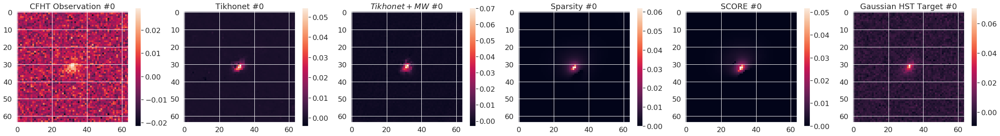

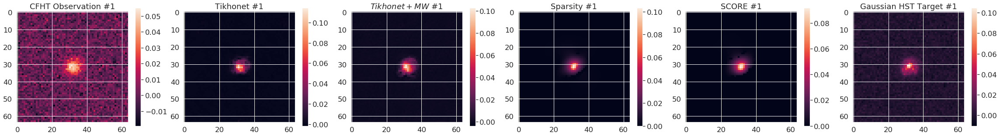

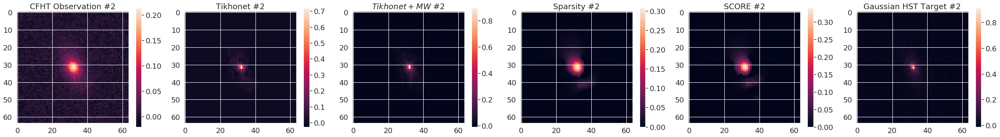

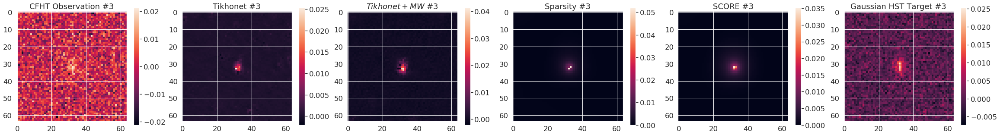

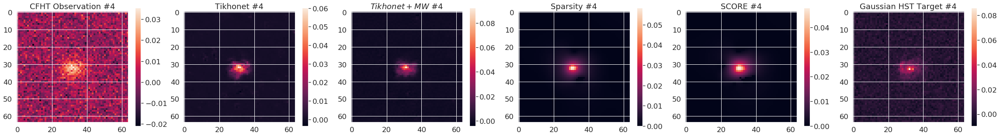

...

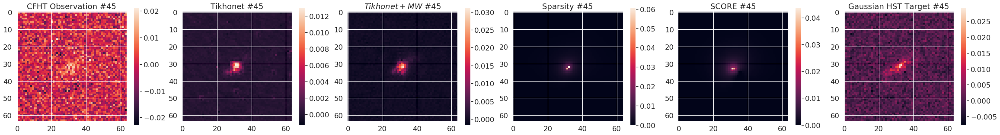

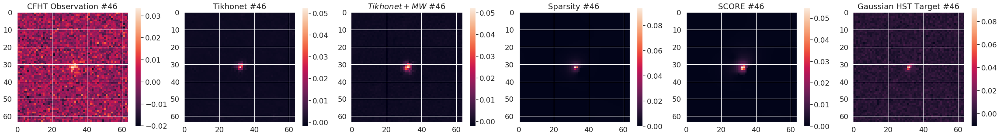

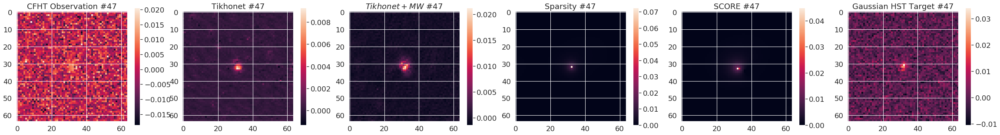

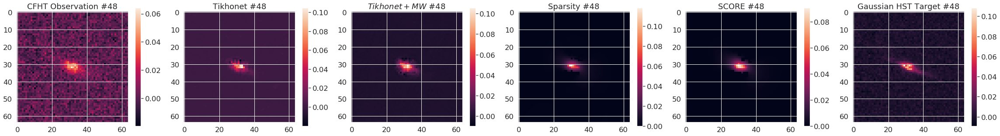

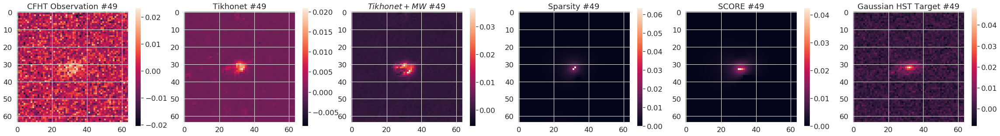

In [6]:
# set seaborn theme and style
sns.set_theme()
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

for i in range(50):#n_batch):
    plt.figure(33,figsize=(40,5))
    plt.subplot(161)
    plt.imshow(batch['inputs'][window_flags][i])
    plt.title('CFHT Observation #{}'.format(i))
    plt.colorbar()
    plt.subplot(162)
    plt.imshow(res_np[window_flags][i])
    plt.title(r'Tikhonet #{}'.format(i))
    plt.colorbar()
    plt.subplot(163)
    plt.imshow(res_g05_np[window_flags][i])
    plt.title(r'$Tikhonet + MW$ #{}'.format(i))
    plt.colorbar()
    plt.subplot(164)
    plt.imshow(score_g0[window_flags][i])
    plt.title(r'Sparsity #{}'.format(i))
    plt.colorbar()
    plt.subplot(165)
    plt.imshow(score_g1[window_flags][i])
    plt.title(r'SCORE #{}'.format(i))
    plt.colorbar()
    plt.subplot(166)
    plt.imshow(batch['targets'][window_flags][i])
    plt.title('Gaussian HST Target #{}'.format(i))
    plt.colorbar()
    plt.show()

## Plot Failed Galaxy Images

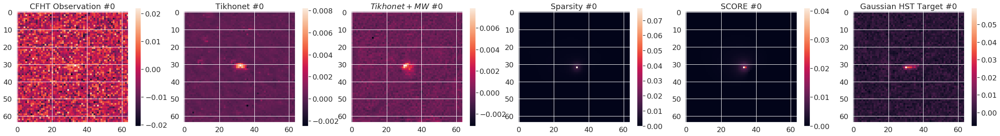

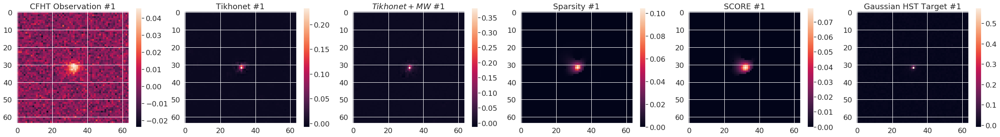

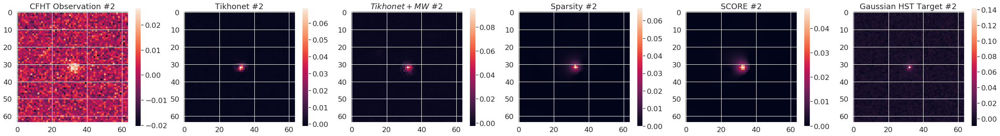

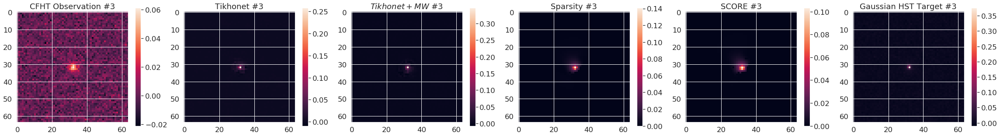

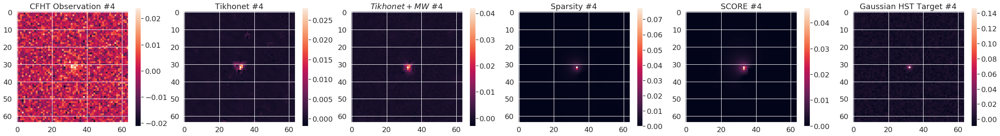

...

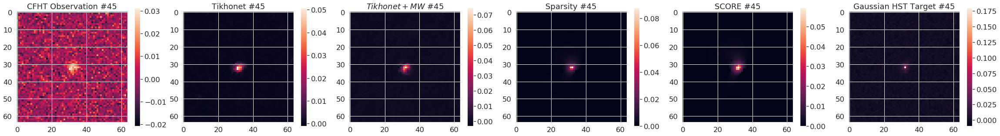

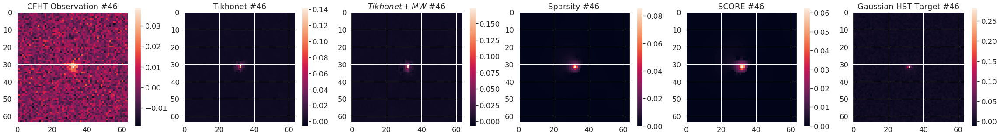

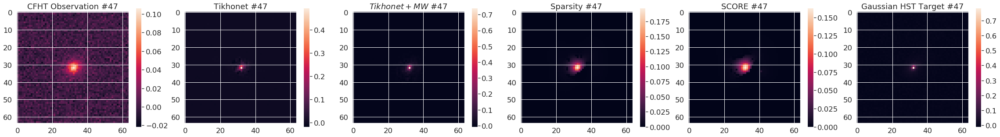

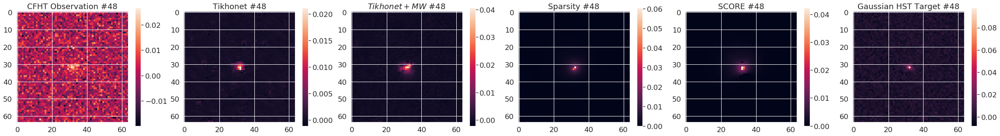

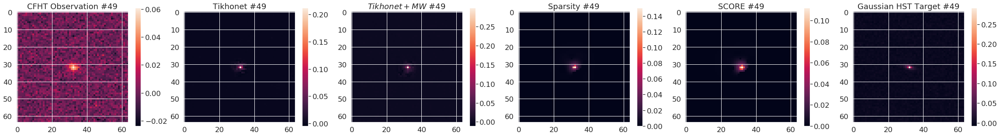

In [7]:
# set seaborn theme and style
sns.set_theme()
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

for i in range(50):#n_batch):
    plt.figure(33,figsize=(40,5))
    plt.subplot(161)
    plt.imshow(batch['inputs'][np.logical_not(window_flags)][i])
    plt.title('CFHT Observation #{}'.format(i))
    plt.colorbar()
    plt.subplot(162)
    plt.imshow(res_np[np.logical_not(window_flags)][i])
    plt.title(r'Tikhonet #{}'.format(i))
    plt.colorbar()
    plt.subplot(163)
    plt.imshow(res_g05_np[np.logical_not(window_flags)][i])
    plt.title(r'$Tikhonet + MW$ #{}'.format(i))
    plt.colorbar()
    plt.subplot(164)
    plt.imshow(score_g0[np.logical_not(window_flags)][i])
    plt.title(r'Sparsity #{}'.format(i))
    plt.colorbar()
    plt.subplot(165)
    plt.imshow(score_g1[np.logical_not(window_flags)][i])
    plt.title(r'SCORE #{}'.format(i))
    plt.colorbar()
    plt.subplot(166)
    plt.imshow(batch['targets'][np.logical_not(window_flags)][i])
    plt.title('Gaussian HST Target #{}'.format(i))
    plt.colorbar()
    plt.show()

### Save Samples

In [19]:
# choose 5 unflagged galaxies (successful moments estimation)
i_s = [1,3,4,23,42]
# choose 5 flagged galaxies (failed moments estimation)
i_f = [6,7,8,12,14]

keys = ['inputs', 
        'inputs_tikho',
        'targets',
        'psf_cfht',
        'mag_auto',
        'flux_radius',
        'sparsity',
        'score',
        'tikhonet',
        'tikhonet_sc']
values = [batch['inputs'],
          batch['inputs_tikho'],
          batch['targets'],
          batch['psf_cfht'],
          batch['mag_auto'],
          batch['flux_radius'],
          score_g0,
          score_g1,
          res_np,
          res_g05_np]


examples = {}

examples['flagged'] = {}
examples['unflagged'] = {}

for key, value in zip(keys, values):
    for i in range(len(i_f)):
        examples['flagged'][key][i] = value[np.logical_not(window_flags)][i_f[i]]
        examples['unflagged'][key][i] = value[window_flags][j]

In [20]:
# save dictionnary
f = open(data_path+"cfht_examples.pkl","wb")
pickle.dump(examples,f)
f.close()

In [21]:
f = open(data_path+"cfht_examples.pkl", "rb")
test = pickle.load(f)
f.close()

In [22]:
test.keys()

dict_keys(['flagged', 'unflagged'])

In [26]:
batch['inputs'][1,2].shape

(64,)

In [28]:
np.take_along_axis(batch['inputs'], np.array(i_f), 0).shape

ValueError: `indices` and `arr` must have the same number of dimensions